In [2]:
pip install -U pandas torchvision mlflow lightning

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install git+https://github.com/pytorch/captum.git

  Cloning https://github.com/pytorch/captum.git to /tmp/pip-req-build-0csdiany
  Running command git clone --filter=blob:none --quiet https://github.com/pytorch/captum.git /tmp/pip-req-build-0csdiany
  Resolved https://github.com/pytorch/captum.git to commit 945c582cc0b08885c4e2bfecb020abdfac0122f3
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import numpy as np
import torchvision
import torch
import random
import os 
import json
import matplotlib.pyplot as plt 
import mlflow
import seaborn as sns
import pickle 

from tqdm import tqdm
from pathlib import Path
from mouse_facial_expressions.paths import *
from mouse_facial_expressions.data.datasets import *
from mouse_facial_expressions.data.make_datasets import get_treatment_video_dataframe
from torch.utils.data import DataLoader

client = mlflow.MlflowClient('../mlruns')

EXPERIMENT_NAME = 'baseline-noaug-v1.X'

In [4]:
def get_runs_by_dataset_version(experiment_name, version):
    experiment = client.search_experiments(filter_string=f"name='{experiment_name}'")[0]
    runs = client.search_runs(experiment_ids=experiment.experiment_id, order_by=["start_time"])
    filtered_runs = []
    for run in tqdm(runs):
        # Skip the main run
        parent = client.get_parent_run(run.info.run_id)
        if parent is None:
            continue
        
        # Skip runs with the wrong version
        if not run.data.params['dataset_version'] == version:
            continue

        filtered_runs.append(run)

    return filtered_runs




## Plotting Metrics

100%|██████████| 44/44 [00:00<00:00, 828.30it/s]


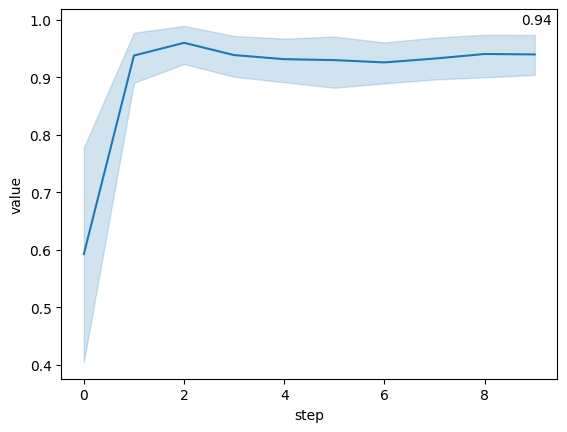

100%|██████████| 44/44 [00:00<00:00, 857.21it/s]


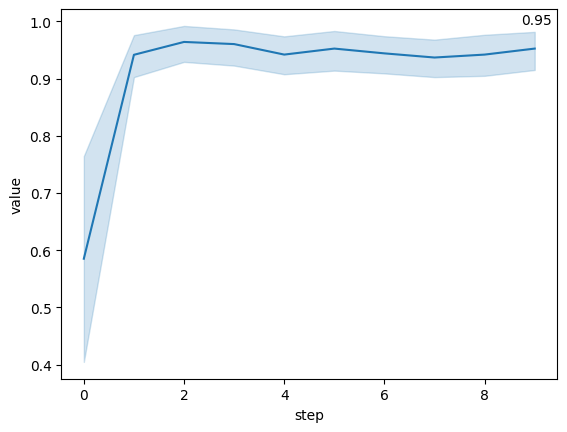

100%|██████████| 44/44 [00:00<00:00, 916.40it/s]


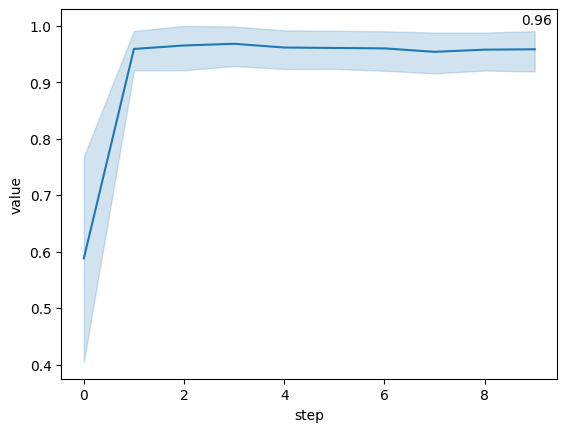

100%|██████████| 44/44 [00:00<00:00, 904.68it/s]


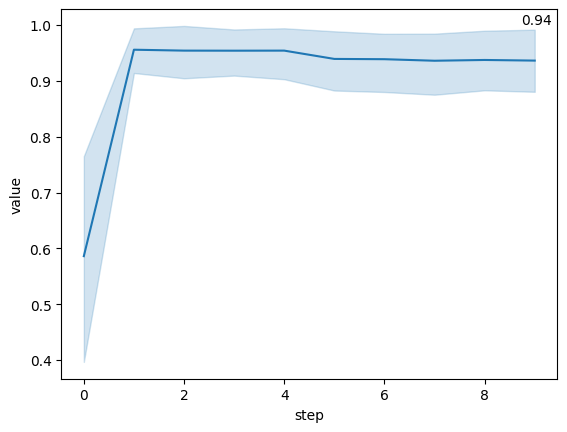

In [5]:
def make_metric_df(runs, metric):
    rows = []
    for run in runs:
        metric_history = client.get_metric_history(run.info.run_id, metric)
        rows += [{'value': x.value, 'step': x.step} for x in metric_history]
        
    return pd.DataFrame(rows)

# for version in ['1.1', '1.2', '1.3', '1.4', '1.5', '1.6', '1.7']:
#     runs = get_runs_by_dataset_version(experiment_name='baseline-v1.X', version=version)

for version in ['1.1', '1.2', '1.5', '1.7']:
    runs = get_runs_by_dataset_version(experiment_name=EXPERIMENT_NAME, version=version)
    metric_df = make_metric_df(runs, 'val_acc')
    plt.figure()
    ax = plt.gca()
    sns.lineplot(data=metric_df, x='step', y='value', ax=ax)
    plt.text(.99, .99, f"{metric_df[metric_df.step==9].value.mean():.2f}", ha='right', va='top', transform=ax.transAxes)
    plt.show()

In [7]:
def get_model_from_run(run):
    artifact_folder = Path(run.info.artifact_uri.split('://')[-1])
    model_uri = artifact_folder / 'model'
    model = mlflow.pytorch.load_model(str(model_uri))
    return model

def get_meta_info(run):
    artifact_folder = Path(run.info.artifact_uri.split('://')[-1])
    meta_info_file = artifact_folder / 'meta_info/train_meta.json'
    with open(meta_info_file, 'r') as fp:
        meta_info = json.load(fp)

    return meta_info

def get_testable_mice(run):
    artifact_folder = Path(run.info.artifact_uri.split('://')[-1])
    testable_videos_mask = pd.read_csv(artifact_folder / 'testable_videos_mask/testable_videos_mask.csv', index_col=0)
    testable_mice = (testable_videos_mask==1).all(axis=1)
    return testable_mice[testable_mice].index.unique().to_list()

def get_evaluation_dataset(version):
    task_folder = get_task_folder(version=version)
    with open(task_folder / 'eval.pkl', 'rb') as fp:
        eval_dataset = pickle.load(fp)

    df = get_treatment_video_dataframe()
    eval_transform = torchvision.transforms.Compose([
        torchvision.transforms.ToTensor(),
    ])
    
    dataset = Task1FoldDataset(samples=eval_dataset['eval'], df=df, transform=eval_transform)
    return dataset
    
SEED = 123456
results = []
# for version in ['1.1', '1.2', '1.3', '1.4', '1.5', '1.6', '1.7']:
for version in ['1.1']:
    runs = get_runs_by_dataset_version(experiment_name=EXPERIMENT_NAME, version=version)
    for run in tqdm(runs):
        random.seed(SEED)
        np.random.seed(SEED)
        # torch.use_deterministic_algorithms(True)
        torch.manual_seed(SEED)

        test_mice = get_testable_mice(run)
        model = get_model_from_run(run).to('cuda')
        dataset = get_evaluation_dataset(version)
        dataloader = DataLoader(dataset, batch_size=100, num_workers=8)

        preds = []
        softmax_preds = []
        for batch in dataloader:
            x, y = batch
            x = x.to('cuda')
            with torch.no_grad():
                pred = model(x)
                softmax_pred = torch.nn.functional.softmax(pred, dim=1)
                preds.append(pred.cpu().numpy())
                softmax_preds.append(softmax_pred.cpu().numpy())

        preds = np.concatenate(preds)
        softmax_preds = np.concatenate(softmax_preds)

        result = pd.DataFrame()
        result[['s0', 's1']] = preds
        result[['p0', 'p1']] = softmax_preds
        result['mouse'] = [dataset.df.loc[sample['indices']].mouse.unique()[0] for sample in dataset.samples]
        result['video'] = [dataset.df.loc[sample['indices']].video.unique()[0] for sample in dataset.samples]
        result['recording'] = [dataset.df.loc[sample['indices']].recording.unique()[0] for sample in dataset.samples]
        result['treatment'] = [dataset.df.loc[sample['indices']].treatment.unique()[0] for sample in dataset.samples]
        result['eval'] = result.mouse.apply(lambda x: x in test_mice)
        result['version'] = version
        results.append(result)
    
    break

results = pd.concat(results)
# results = results.reset_index()

100%|██████████| 8/8 [00:35<00:00,  4.39s/it]


<Axes: xlabel='recording', ylabel='s1'>

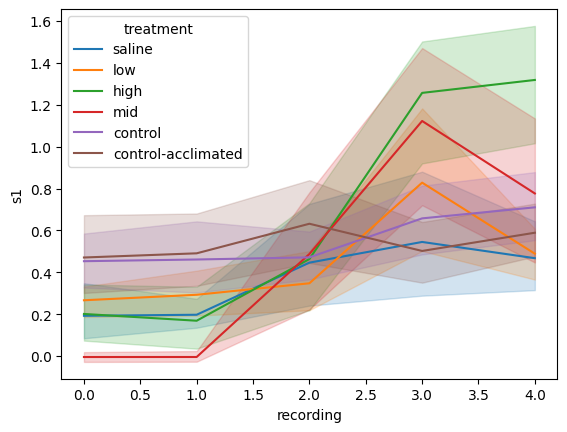

In [8]:
temp = results[results['eval'] & (results['version']=='1.1')]
temp = temp.groupby('video').agg({'recording': 'first', 's1': 'mean', 'p1': 'mean', 'treatment': 'first'})
sns.lineplot(data=temp, x='recording', y='s1', hue='treatment')

## Occlusion Explainability

In [35]:
results[results['eval'] & (results.treatment == 'high')]

,s0,s1,p0,p1,mouse,video,recording,treatment,eval,version
900,1.901817,0.314838,0.830191,0.169809,f31,f31_rec0_acclimation,0,high,True,1.1
901,2.565171,0.113772,0.920664,0.079336,f31,f31_rec0_acclimation,0,high,True,1.1
902,2.733446,0.062766,0.935274,0.064726,f31,f31_rec0_acclimation,0,high,True,1.1
903,1.757118,0.358697,0.801933,0.198067,f31,f31_rec0_acclimation,0,high,True,1.1
904,0.573336,0.717507,0.464019,0.535981,f31,f31_rec0_acclimation,0,high,True,1.1
...,...,...,...,...,...,...,...,...,...,...
1095,-2.630604,1.414521,0.017206,0.982794,f3,f3_rec4_4h-postinjection,4,high,True,1.1
1096,-2.703843,1.430172,0.015766,0.984234,f3,f3_rec4_4h-postinjection,4,high,True,1.1
1097,-2.459615,1.377981,0.021091,0.978909,f3,f3_rec4_4h-postinjection,4,high,True,1.1
1098,-2.618650,1.411966,0.017453,0.982547,f3,f3_rec4_4h-postinjection,4,high,True,1.1


  0%|          | 0/9 [00:00<?, ?it/s]

 44%|████▍     | 4/9 [00:00<00:00, 30.25it/s]


male
male
male
male
100
---
label -1
torch.Size([1, 3, 300, 300])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(300, 300, 3)


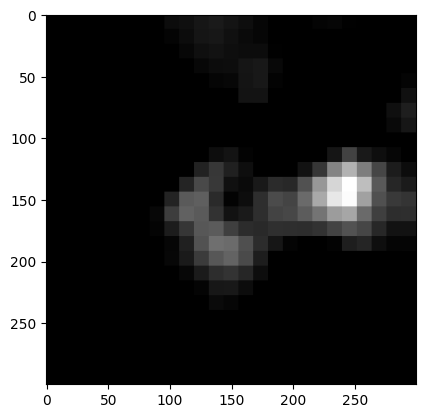

In [117]:
import captum
from IPython.display import display
from pathlib import Path

MAKE_PLOTS = False

figures_path = Path('.').resolve().parent / 'reports' / '20230803-noaug'
if not figures_path.exists():
    figures_path.mkdir(parents=True)

for version in ['3.0']:
    runs = get_runs_by_dataset_version(experiment_name="sex-differences", version=version)
    random.seed(SEED)
    np.random.seed(SEED)
    torch.manual_seed(SEED)

    for run in tqdm(runs):
        test_mice = get_testable_mice(run)
        model = get_model_from_run(run).to('cuda')

        if run.data.tags['sex'] == 'female':
            break 

        print(run.data.tags['sex'])

occlusion = captum.attr.Occlusion(model)

np.random.seed(32)
indices = results[(results['eval']) & (results.treatment=='high')&(results.recording.isin([4]))].index
average_results = dict()
print(len(indices))
images = []

for i in np.random.choice(indices, size=1):
    x, y = dataset[i]


    # x = x[0]
    # target = y
    target = 1
    # target = model(x)
    print('---')
    print('label', y)
    # display(torchvision.transforms.ToPILImage()(x))
    images += [torchvision.transforms.ToPILImage()(xi) for xi in x]
    x = x.to('cuda')
    print(x.shape)
    row = results.loc[i].iloc[0]

    for k in range(x.shape[0]):
        for label in ['negative']:
            attributions_occ = occlusion.attribute(
                x[k].unsqueeze(0).unsqueeze(0).to('cuda'),
                strides = (1, 3, 12, 12),
                target=1,
                sliding_window_shapes=(1,3,24,24),
                baselines=0)

            attributions_occ = attributions_occ.squeeze().squeeze().cpu().detach().numpy()
            attributions_occ = attributions_occ / attributions_occ.max()
            # plt.imshow(attributions_occ.transpose(1,2,0).astype(float))
            # plt.show()

            if not f"{label}_small" in average_results:
                average_results[f"{label}_small"] = [attributions_occ]
            else:
                average_results[f"{label}_small"].append(attributions_occ)
                

    plt.figure()
    occ = np.stack(average_results['negative_small'])
    # occ[occ<0] = 0
    occ *= -1 
    # occ = np.abs(occ)
    occ = occ.mean(axis=0).transpose(1,2,0)
    occ = occ / occ.max()
    print(occ.shape)     
    female_occ = occ.copy()                          
    plt.imshow(occ)
    plt.show()

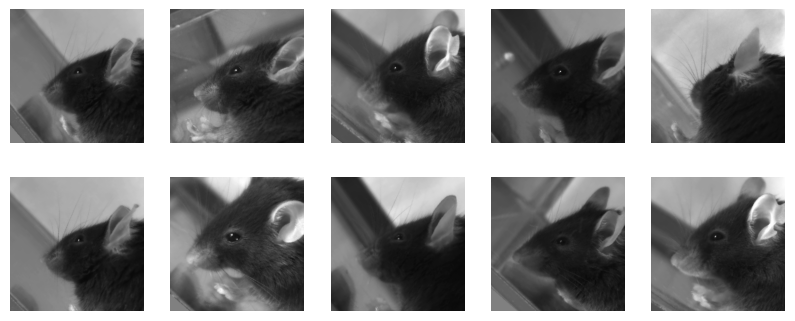

In [89]:
gs = plt.GridSpec(2, 5)
fig = plt.figure(figsize=(10, 4))
for i in range(10):
    ax = fig.add_subplot(gs[i])
    ax.imshow(images[i])
    ax.axis('off')

plt.title('High Treatment')
plt.savefig('face-examples.png')

 44%|████▍     | 4/9 [00:00<00:00, 33.86it/s]


male
male
male
male
100
---
label -1
torch.Size([1, 3, 300, 300])
(300, 300, 3)


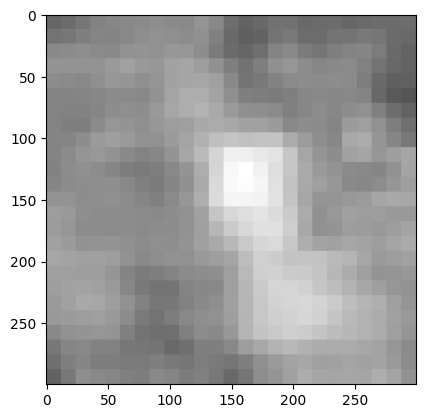

---
label -1
torch.Size([1, 3, 300, 300])
(300, 300, 3)


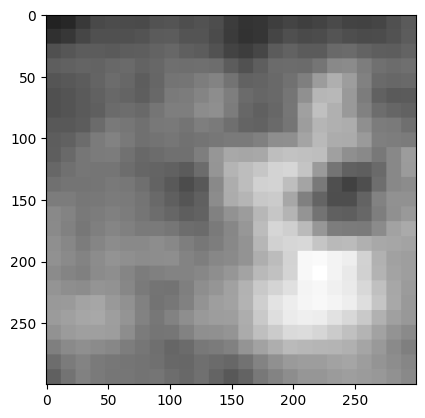

---
label -1
torch.Size([1, 3, 300, 300])
(300, 300, 3)


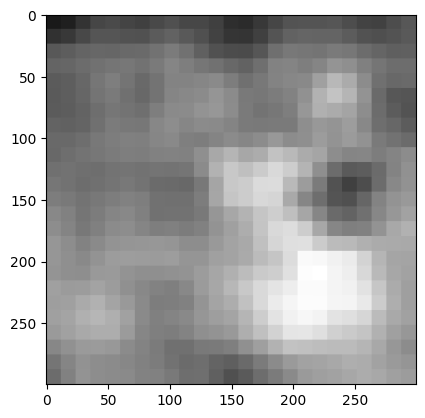

---
label -1
torch.Size([1, 3, 300, 300])
(300, 300, 3)


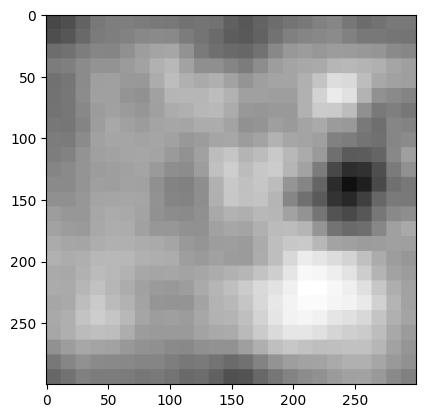

---
label -1
torch.Size([1, 3, 300, 300])
(300, 300, 3)


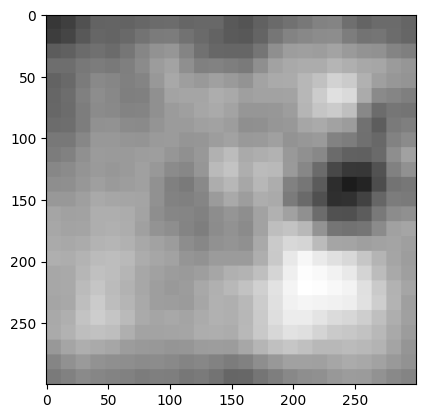

---
label -1
torch.Size([1, 3, 300, 300])
(300, 300, 3)


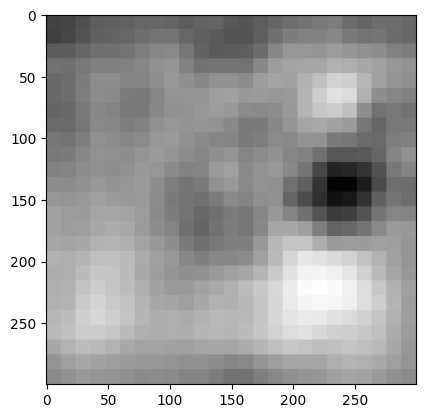

---
label -1
torch.Size([1, 3, 300, 300])
(300, 300, 3)


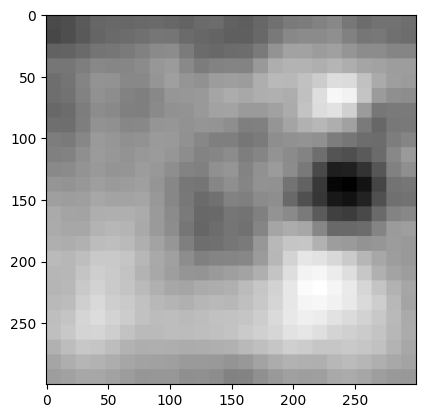

---
label -1
torch.Size([1, 3, 300, 300])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(300, 300, 3)


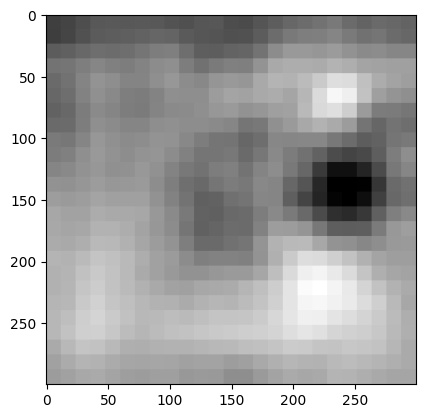

---
label -1
torch.Size([1, 3, 300, 300])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(300, 300, 3)


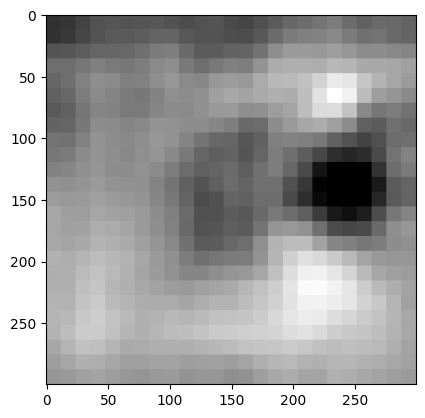

---
label -1
torch.Size([1, 3, 300, 300])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(300, 300, 3)


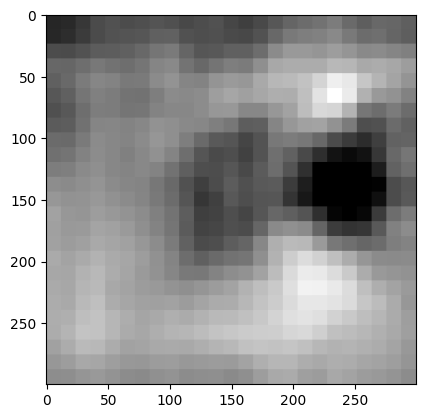

In [123]:
import captum
from IPython.display import display
from pathlib import Path

MAKE_PLOTS = False

figures_path = Path('.').resolve().parent / 'reports' / '20230803-noaug'
if not figures_path.exists():
    figures_path.mkdir(parents=True)

for version in ['3.0']:
    runs = get_runs_by_dataset_version(experiment_name="sex-differences", version=version)
    random.seed(SEED)
    np.random.seed(SEED)
    torch.manual_seed(SEED)

    for run in tqdm(runs):
        test_mice = get_testable_mice(run)
        model = get_model_from_run(run).to('cuda')

        if run.data.tags['sex'] == 'male':
            break 

        print(run.data.tags['sex'])

occlusion = captum.attr.Occlusion(model)

np.random.seed(42)
indices = results[(results['eval']) & (results.treatment=='high')&(results.recording.isin([4]))].index
average_results = dict()
print(len(indices))
images = []

for i in np.random.choice(indices, size=10):
    x, y = dataset[i]


    # x = x[0]
    # target = y
    target = 1
    # target = model(x)
    print('---')
    print('label', y)
    # display(torchvision.transforms.ToPILImage()(x))
    images += [torchvision.transforms.ToPILImage()(xi) for xi in x]
    x = x.to('cuda')
    print(x.shape)
    row = results.loc[i].iloc[0]

    for k in range(x.shape[0]):
        for label in ['negative']:
            attributions_occ = occlusion.attribute(
                x[k].unsqueeze(0).unsqueeze(0).to('cuda'),
                strides = (1, 3, 12, 12),
                target=1,
                sliding_window_shapes=(1,3,24,24),
                baselines=3)

            attributions_occ = attributions_occ.squeeze().squeeze().cpu().detach().numpy()
            # attributions_occ = attributions_occ / attributions_occ.max()
            # plt.imshow(attributions_occ.transpose(1,2,0).astype(float))
            # plt.show()

            if not f"{label}_small" in average_results:
                average_results[f"{label}_small"] = [attributions_occ]
            else:
                average_results[f"{label}_small"].append(attributions_occ)
                

    plt.figure()
    occ = np.stack(average_results['negative_small'])
    # occ[occ<0] = 0
    # occ *= -1 
    # occ = np.abs(occ)
    occ = occ.mean(axis=0).transpose(1,2,0)
    occ = occ / occ.max()
    print(occ.shape)     
    male_occ = occ.copy()                          
    plt.imshow(occ)
    plt.show()

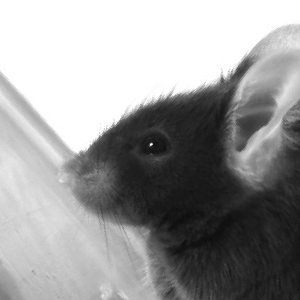

In [22]:
images[-6]

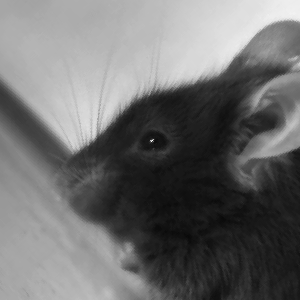

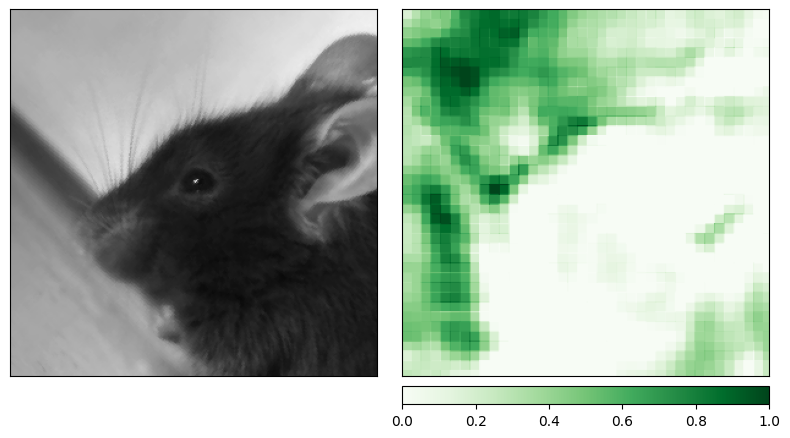

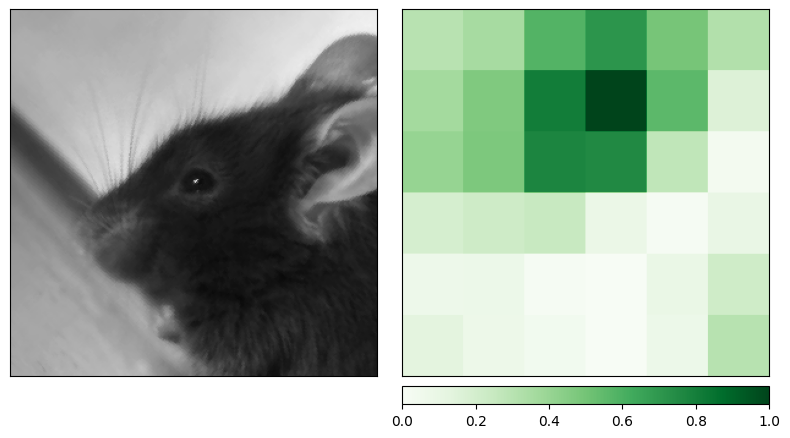

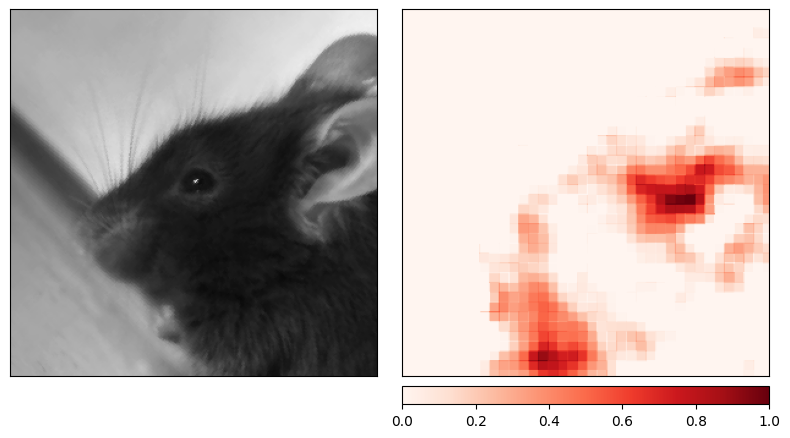

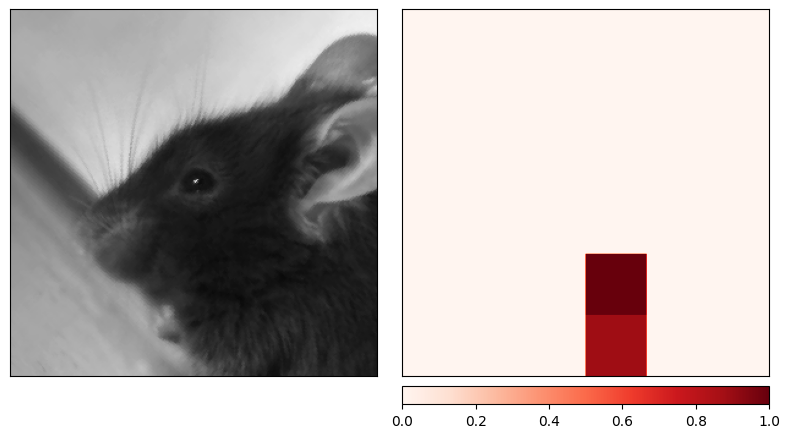

...

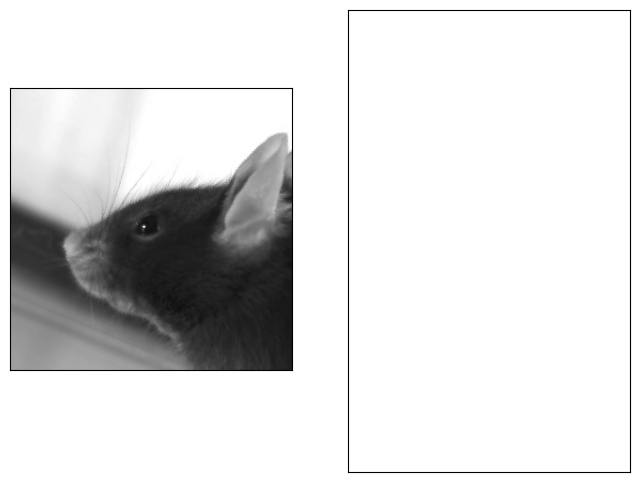

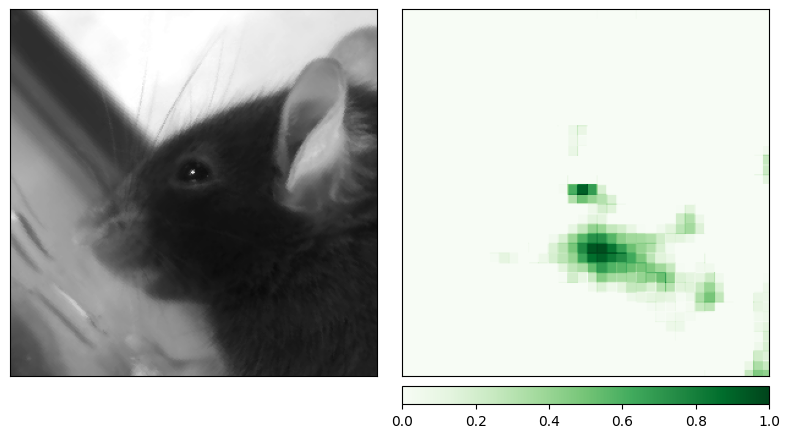

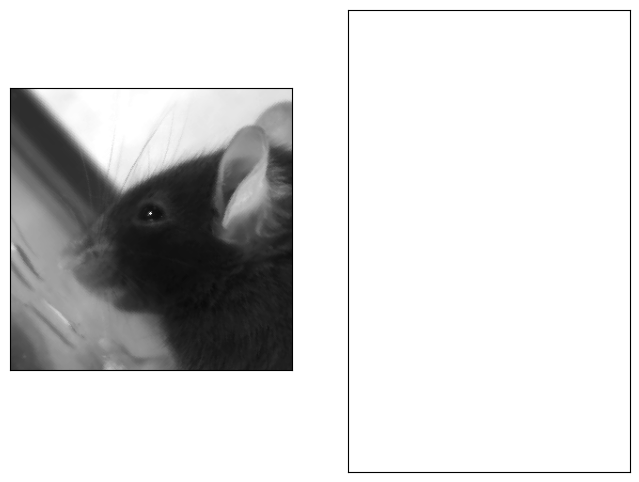

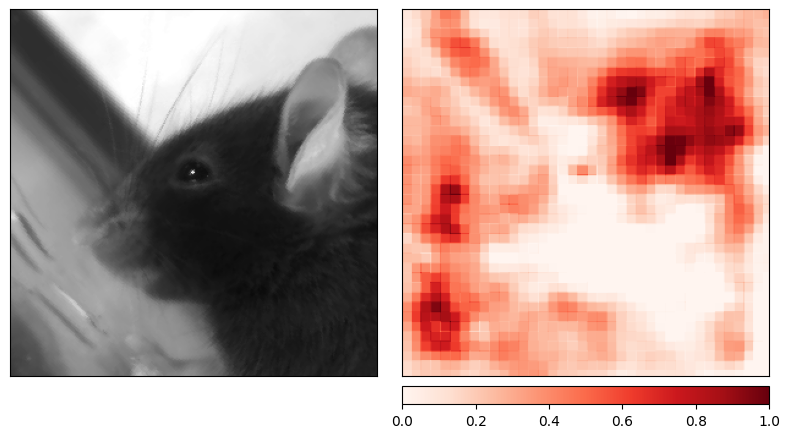

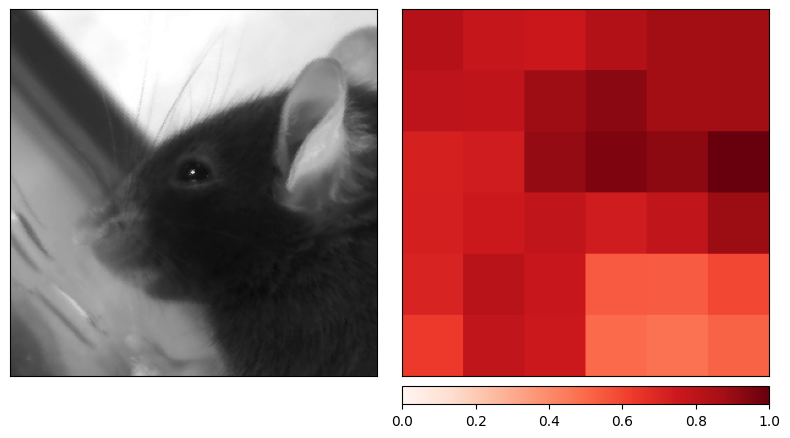

In [57]:
import captum
from IPython.display import display
from pathlib import Path

figures_path = Path('.').resolve().parent / 'reports' / '20230803-noaug'
if not figures_path.exists():
    figures_path.mkdir(parents=True)

occlusion = captum.attr.Occlusion(model)

np.random.seed(123456)
indices = results[(results.treatment=='high')&(results.recording.isin([1,4]))&(results['eval'])].index
for i in np.random.choice(indices, size=20):
    x, y = dataset[i]
    x = x[0]
    display(torchvision.transforms.ToPILImage()(x))
    x = x.to('cuda')
    row = results.loc[i].iloc[0]

    for label in ['positive', 'negative']:
        try:
            attributions_occ = occlusion.attribute(
                x.unsqueeze(0).unsqueeze(0).to('cuda'),
                strides = (1, 3, 8, 8),
                target=0,
                sliding_window_shapes=(1,3,15, 15),
                baselines=0)

            fig, ax = captum.attr.visualization.visualize_image_attr_multiple(
                np.transpose(attributions_occ.squeeze().squeeze().cpu().detach().numpy(), (1,2,0)),
                np.transpose(x.cpu().detach().numpy(), (1,2,0)),
                ["original_image", "heat_map"],
                ["all", label],
                show_colorbar=True,
                outlier_perc=1,
                use_pyplot=True
                )
            
            fig.savefig(figures_path / f"{row.video}_sample{i:05}_small_{label}.png")
            fig.savefig(figures_path / f"{row.video}_sample{i:05}_small_{label}.pdf")
            attributions_occ = occlusion.attribute(
                x.unsqueeze(0).unsqueeze(0).to('cuda'),
                strides = (1, 3, 50, 50),
                target=0,
                sliding_window_shapes=(1,3,100,100),
                baselines=0)

            fig, ax = captum.attr.visualization.visualize_image_attr_multiple(
                np.transpose(attributions_occ.squeeze().squeeze().cpu().detach().numpy(), (1,2,0)),
                np.transpose(x.cpu().detach().numpy(), (1,2,0)),
                ["original_image", "heat_map"],
                ["all", label],
                show_colorbar=True,
                outlier_perc=1,
                use_pyplot=True
                )
            
            fig.savefig(figures_path / f"{row.video}_sample{i:05}_large_{label}.png")
            fig.savefig(figures_path / f"{row.video}_sample{i:05}_large_{label}.pdf")
        except:
            pass